<a href="https://colab.research.google.com/github/NguyenThuVan/portfolio_project/blob/main/Predicting%20Default%20Risk%20of%20Lending%20Club%20Loans.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import pandas as pd
from pandas import Series, DataFrame

pd.set_option('display.max_rows', None,'display.max_columns', None)

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

from collections import Counter

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve, cross_validate
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, make_scorer, roc_auc_score,accuracy_score, roc_curve
import scipy.stats as stats
from imblearn.over_sampling import SMOTE


from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
#from sklearn import cross_validation
from sklearn import metrics

import warnings
warnings.filterwarnings("ignore") 

pd.set_option('display.max_columns', None) # Display any number of columns


## 1. Introduction
<a id="intro"></a>
The objective is to use the loan data to build a model that can predict the loan status (whether or not a loan will be fully paid or charged off) and interpret the results to find the factors which affect the result. Such a predictive model could help LendingClub investors make better-informed investment decisions.

We want to develop a model that is **accurate** and **interpretable**.

This problem is a binary classification as I have only two classes to predict.

## 2. Data
<a id="importdata"></a>

In [ ]:
! gdown --id 19QCsrOsI_G6wL5wLMtTEOwN1H69k-IEr

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=19QCsrOsI_G6wL5wLMtTEOwN1H69k-IEr
To: /content/lc_loan.csv
100% 442M/442M [00:02<00:00, 170MB/s]


In [ ]:
df = pd.read_csv('/content/lc_loan.csv')

In [ ]:
df.head(5)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,1077501,1296599,5000.0,5000.0,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-2011,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-1985,1.0,NaN,NaN,3.0,0.0,13648.0,83.7,9.0,f,0.0,0.0,5861.071414,5831.78,5000.00,861.07,0.00,0.00,0.00,Jan-2015,171.62,NaN,Jan-2016,0.0,NaN,1.0,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1077430,1314167,2500.0,2500.0,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-2011,Charged Off,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0.0,Apr-1999,5.0,NaN,NaN,3.0,0.0,1687.0,9.4,4.0,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-2013,119.66,NaN,Sep-2013,0.0,NaN,1.0,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1077175,1313524,2400.0,2400.0,2400.0,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-2011,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,small_business,real estate business,606xx,IL,8.72,0.0,Nov-2001,2.0,NaN,NaN,2.0,0.0,2956.0,98.5,10.0,f,0.0,0.0,3003.653644,3003.65,2400.00,603.65,0.00,0.00,0.00,Jun-2014,649.91,NaN,Jan-2016,0.0,NaN,1.0,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1076863,1277178,10000.0,10000.0,10000.0,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-2011,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0.0,Feb-1996,1.0,35.0,NaN,10.0,0.0,5598.0,21.0,37.0,f,0.0,0.0,12226.302212,12226.30,10000.00,2209.33,16.97,0.00,0.00,Jan-2015,357.48,NaN,Jan-2015,0.0,NaN,1.0,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1075358,1311748,3000.0,3000.0,3000.0,60 months,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-2011,Current,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0.0,Jan-1996,0.0,38.0,NaN,15.0,0.0,27783.0,53.9,38.0,f,766.9,766.9,3242.170000,3242.17,2233.10,1009.07,0.00,0.00,0.00,Jan-2016,67.79,Feb-2016,Jan-2016,0.0,NaN,1.0,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 887379 entries, 0 to 887378
Data columns (total 74 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           887379 non-null  int64  
 1   member_id                    887379 non-null  int64  
 2   loan_amnt                    887379 non-null  float64
 3   funded_amnt                  887379 non-null  float64
 4   funded_amnt_inv              887379 non-null  float64
 5   term                         887379 non-null  object 
 6   int_rate                     887379 non-null  float64
 7   installment                  887379 non-null  float64
 8   grade                        887379 non-null  object 
 9   sub_grade                    887379 non-null  object 
 10  emp_title                    835917 non-null  object 
 11  emp_length                   842554 non-null  object 
 12  home_ownership               887379 non-null  object 
 13 

In [ ]:
# Convert next_pymnt_d, last_pymnt_d, issue_d into datetime type
df[['issue_d', 'next_pymnt_d', 'last_pymnt_d', 'earliest_cr_line']] = df[['issue_d', 'next_pymnt_d', 'last_pymnt_d', 'earliest_cr_line']].apply(pd.to_datetime)

The dataset has numerical, categorical and missing values. Because there are so many features (150+), i will start the data engineering with dropping unnecessary features and then deal with the remaining features more in detail. 

## 3. Target Variable
<a id="targetvariable"></a>

In [ ]:
df['loan_status'].value_counts()

Current                                                601779
Fully Paid                                             207723
Charged Off                                             45248
Late (31-120 days)                                      11591
Issued                                                   8460
In Grace Period                                          6253
Late (16-30 days)                                        2357
Does not meet the credit policy. Status:Fully Paid       1988
Default                                                  1219
Does not meet the credit policy. Status:Charged Off       761
Name: loan_status, dtype: int64

In [ ]:
# transform term into number of months  
df['term'] = df['term'].apply(lambda x:str(x).rstrip('months'))
df['term'] = df['term'].astype('int64')

In [ ]:
df.last_pymnt_d.max()

Timestamp('2016-01-01 00:00:00')

In [ ]:
cutoff_date = df.last_pymnt_d.max()
df.loc[:, 'loan_age'] = df.issue_d.apply(lambda x: cutoff_date - x).astype('timedelta64[M]')

In [ ]:
# distinguish 2 cases:
#   if the loan_length >= term : matured
#   else : not matured 

df_matured_loan = df[df['loan_age'] >= df['term']]

In [ ]:
# distinguish target variable into 2 types:
#   Non-default = 0
#   Default = 1
df_matured_loan.loc[df_matured_loan['loan_status'].isin(['Charged Off','Late (31-120 days)', 'Late (16-30 days)', 'Default', 'Does not meet the credit policy. Status:Charged Off', 'In Grace Period', 'Current']), 'loan_type'] = 1
df_matured_loan.loc[df_matured_loan['loan_status'].isin(['Fully Paid', 'Does not meet the credit policy. Status:Fully Paid']), 'loan_type'] = 0

In [ ]:
df.shape

(887379, 75)

In [ ]:
df_matured_loan.shape

(78385, 76)

In [ ]:
df_loan_36months = df[(df['term'] == 36) & (df['loan_age'] < 36) & (df['loan_age'] >= 30)]
df_loan_36months.loc[df_loan_36months['loan_status'].isin(['Late (31-120 days)', 'Charged Off', 'Default', 'Does not meet the credit policy. Status:Charged Off']), 'loan_type'] = 1
df_loan_36months.loc[df_loan_36months['loan_status'].isin(['Late (16-30 days)', 'Current', 'Fully Paid', 'Does not meet the credit policy. Status:Fully Paid', 'In Grace Period']), 'loan_type'] = 0

In [ ]:
df_loan_36months.shape

(50102, 76)

In [ ]:
df_matured_loan = pd.concat([df_matured_loan, df_loan_36months], ignore_index=True)

In [ ]:
df_matured_loan.shape

(128487, 76)

In [ ]:
df_matured_loan['loan_type'].value_counts(normalize=True)

0.0    0.869621
1.0    0.130379
Name: loan_type, dtype: float64

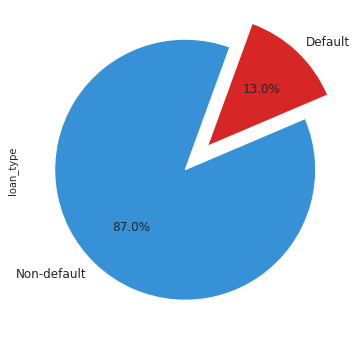

In [ ]:
fig = plt.figure(figsize = (10, 6))
 
colors = ["#3791D7", "#D72626"]
labels ="Non-default", "Default"

df_matured_loan["loan_type"].value_counts().plot.pie(explode=[0,0.25], autopct='%1.1f%%', shadow=False, colors=colors, 
                                             labels=labels, fontsize=12, startangle=70, figsize=(10, 6))

## 4. Data Cleaning
<a id="featureselection"></a>

The raw data has 73 features, but not all of them are useful. 

I will drop the features with the following criteria:
- More than 35% of the data is missing

I will also address the following:
- convert strings to numerical values
- drop superfluous attributes
- highly correlated predictors

### 4.1 Drop features missing too much data
<a id="missing_data"></a>

In [ ]:
# Define a function to visulize the features with missing values, and % of total values, & datatype
def missing_values_table(df):
    # Total missing values
    mis_val = df.isnull().sum()
    # Percentage of missing values
    mis_val_percent = 100 * df.isnull().sum() / len(df)
    mis_val_type = df.dtypes
    # Make a table with the results
    mis_val_table = pd.concat([mis_val, mis_val_percent, mis_val_type], axis=1)
        
     # Rename the columns
    mis_val_table_ren_columns = mis_val_table.rename(columns = {0 : 'Missing Values', 1 : '% of Total Values', 2: 'type'})
        
    # Sort the table by percentage of missing descending
    mis_val_table_ren_columns = mis_val_table_ren_columns[ mis_val_table_ren_columns.iloc[:,1] != 0].sort_values('% of Total Values', ascending=False).round(1)
        
    # Print some summary information
    print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n" "There are " + str(mis_val_table_ren_columns.shape[0]) + " columns that have missing values.")
        
    # Return the dataframe with missing information
    return mis_val_table_ren_columns

In [ ]:
missing_values_table(df_matured_loan)

Your selected dataframe has 76 columns.
There are 40 columns that have missing values.


,Missing Values,% of Total Values,type
dti_joint,128487,100.0,float64
annual_inc_joint,128487,100.0,float64
total_cu_tl,128487,100.0,float64
inq_fi,128487,100.0,float64
all_util,128487,100.0,float64
max_bal_bc,128487,100.0,float64
open_rv_24m,128487,100.0,float64
open_rv_12m,128487,100.0,float64
il_util,128487,100.0,float64
total_bal_il,128487,100.0,float64


In [ ]:
missing_frac = df_matured_loan.isnull().mean()
drop_list = sorted(missing_frac[missing_frac > 0.35].index)

In [ ]:
print(drop_list)

['all_util', 'annual_inc_joint', 'desc', 'dti_joint', 'il_util', 'inq_fi', 'inq_last_12m', 'max_bal_bc', 'mths_since_last_delinq', 'mths_since_last_major_derog', 'mths_since_last_record', 'mths_since_rcnt_il', 'next_pymnt_d', 'open_acc_6m', 'open_il_12m', 'open_il_24m', 'open_il_6m', 'open_rv_12m', 'open_rv_24m', 'tot_coll_amt', 'tot_cur_bal', 'total_bal_il', 'total_cu_tl', 'total_rev_hi_lim', 'verification_status_joint']


In [ ]:
len(drop_list)

25

In [ ]:
def drop_cols(cols):
    df_matured_loan.drop(labels=cols, axis=1, inplace=True)

In [ ]:
drop_cols(drop_list)

In [ ]:
df_matured_loan.shape

(128487, 51)

### 4.2 Remove some features
<a id="cheat_data"></a>

The goal of this project is to predict whether a loan will be paid off BEFORE making the decision to lend the loan. Therefore, I would like to **remove the features that were unavailable before lending a loan.**  

In [ ]:
print(sorted(df_matured_loan.columns))

['acc_now_delinq', 'addr_state', 'annual_inc', 'application_type', 'collection_recovery_fee', 'collections_12_mths_ex_med', 'delinq_2yrs', 'dti', 'earliest_cr_line', 'emp_length', 'emp_title', 'funded_amnt', 'funded_amnt_inv', 'grade', 'home_ownership', 'id', 'initial_list_status', 'inq_last_6mths', 'installment', 'int_rate', 'issue_d', 'last_credit_pull_d', 'last_pymnt_amnt', 'last_pymnt_d', 'loan_age', 'loan_amnt', 'loan_status', 'loan_type', 'member_id', 'open_acc', 'out_prncp', 'out_prncp_inv', 'policy_code', 'pub_rec', 'purpose', 'pymnt_plan', 'recoveries', 'revol_bal', 'revol_util', 'sub_grade', 'term', 'title', 'total_acc', 'total_pymnt', 'total_pymnt_inv', 'total_rec_int', 'total_rec_late_fee', 'total_rec_prncp', 'url', 'verification_status', 'zip_code']


I will drop the ones that would have not been available before a loan was lend. 

In [ ]:
drop_list = ['acc_now_delinq', 'collection_recovery_fee', 'collections_12_mths_ex_med', 'funded_amnt', 'funded_amnt_inv', 'inq_last_6mths', 'last_credit_pull_d', 'last_pymnt_amnt', 'last_pymnt_d', 'total_pymnt', 'total_pymnt_inv', 'total_rec_int', 'total_rec_late_fee', 'total_rec_prncp', 'out_prncp', 'out_prncp_inv', 'recoveries', 'pymnt_plan', 'url','loan_status']


In [ ]:
drop_cols(drop_list)

In [ ]:
print(sorted(df_matured_loan.columns))

['addr_state', 'annual_inc', 'application_type', 'delinq_2yrs', 'dti', 'earliest_cr_line', 'emp_length', 'emp_title', 'grade', 'home_ownership', 'id', 'initial_list_status', 'installment', 'int_rate', 'issue_d', 'loan_age', 'loan_amnt', 'loan_type', 'member_id', 'open_acc', 'policy_code', 'pub_rec', 'purpose', 'revol_bal', 'revol_util', 'sub_grade', 'term', 'title', 'total_acc', 'verification_status', 'zip_code']


In [ ]:
len(df_matured_loan.columns)

31

### 4.3 EDA using pandas-profiling

In [ ]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
profile = ProfileReport(df_matured_loan, title = "EDA", html={'style':{'fullwidth':True}})

In [ ]:
# Display the report
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file('lc.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### 4.4 Inspect the features one by one
<a id="inspect"></a>


In [ ]:
# make general plots to examine each feature
def plot_var(col_name, full_name, continuous):
    """
    Visualize a variable with/without faceting on the loan_type.
    - col_name is the variable name in the dataframe
    - full_name is the full variable name
    - continuous is True for continuous variables
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, sharex=False, figsize=(15,3))
    # plot1: counts distribution of the variable
    
    if continuous:  
        sns.distplot(df_matured_loan.loc[df_matured_loan[col_name].notnull(), col_name], kde=False, ax=ax1)
    else:
        sns.countplot(df_matured_loan[col_name], order=sorted(df_matured_loan[col_name].unique()), color='#5975A4', saturation=1, ax=ax1)
    ax1.set_xlabel(full_name)
    ax1.set_ylabel('Count')
    ax1.set_title('Distribution of ' + full_name)

          
    # plot2: bar plot of the variable grouped by loan_type
    if continuous:
        sns.boxplot(x='loan_type', y=col_name, data=df_matured_loan, ax=ax2)
        ax2.set_ylabel('')
        ax2.set_title(full_name + ' by Loan Type')
    else:
        Charged_Off_rates = df_matured_loan.groupby(col_name)['loan_type'].value_counts(normalize=True)[:,1]
        sns.barplot(x=Charged_Off_rates.index, y=Charged_Off_rates.values, color='#5975A4', saturation=1, ax=ax2)
        ax2.set_ylabel('Fraction of Loans Default')
        ax2.set_title('Default Rate by ' + full_name)
        ax2.set_xlabel(full_name)
    
    # plot3: kde plot of the variable gropued by loan_type
    if continuous:  
        facet = sns.FacetGrid(df_matured_loan, hue = 'loan_type', size=3, aspect=4)
        facet.map(sns.kdeplot, col_name, shade=True)
        #facet.set(xlim=(df[col_name].min(), df[col_name].max()))
        facet.add_legend()  
    else:
        fig = plt.figure(figsize=(12,3))
        sns.countplot(x=col_name, hue='loan_type', data=df_matured_loan, order=sorted(df_matured_loan[col_name].unique()) )
     
    plt.tight_layout()


### id, member_id

In [ ]:
len(df_matured_loan['id'].unique())

128487

In [ ]:
len(df_matured_loan['member_id'].unique())

128487

id and member_id are unique index. It's not useful as a categorical variable (so many unique values), nor as a numerical variable (a wild range of its values). Therefore I will drop this feature. 

In [ ]:
drop_cols('id')

In [ ]:
drop_cols('member_id')

### loan_amnt
Data Dictionary: "The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value."

In [ ]:
df_matured_loan['loan_amnt'].describe()

count    128487.000000
mean      11582.875116
std        7057.463207
min         500.000000
25%        6075.000000
50%       10000.000000
75%       15000.000000
max       35000.000000
Name: loan_amnt, dtype: float64

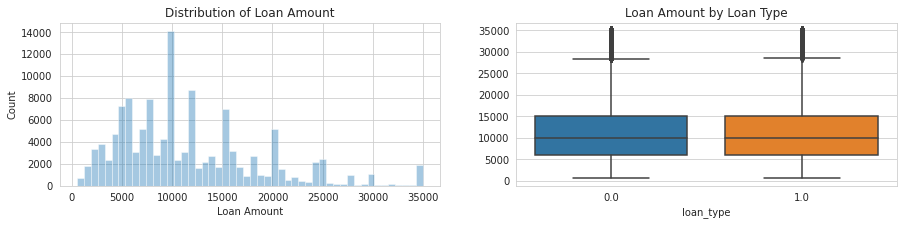

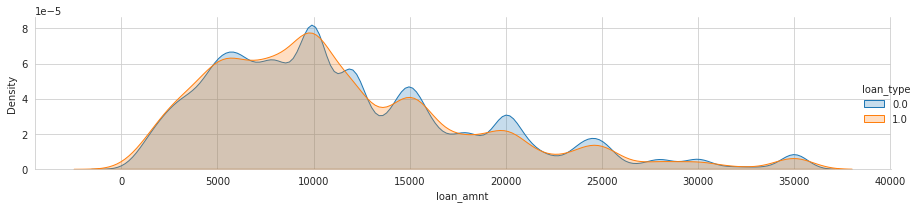

In [ ]:
plot_var('loan_amnt', 'Loan Amount', continuous=True)

"Charged off" loans seem to have higher loan amount. I will further examine the statistical difference in the later session.

### term
Data Dictionary: "The number of payments on the loan. Values are in months and can be either 36 or 60."

In [ ]:
df_matured_loan['term'].value_counts(dropna=False)

36    125106
60      3381
Name: term, dtype: int64

In [ ]:
df_matured_loan.groupby('term')['loan_type'].value_counts(normalize=True).loc[:,1]

term
36    0.127764
60    0.227152
Name: loan_type, dtype: float64

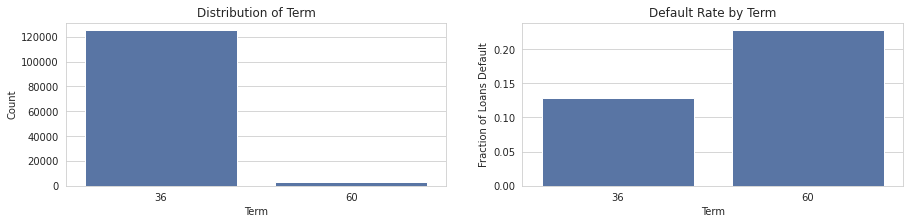

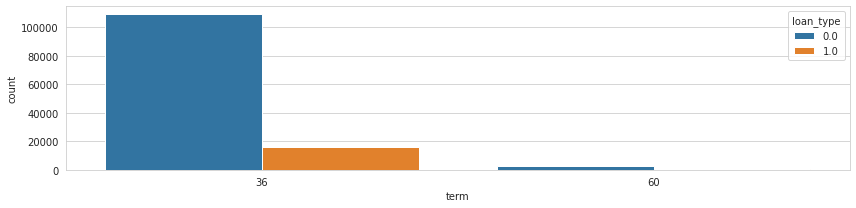

In [ ]:
plot_var('term', 'Term', continuous=False)

1.6% of the 36-month loans are charge off, while 4.9% of the 60-month are charged off. Longer term leads to higher charged off? 

### int_rate

In [ ]:
df_matured_loan['int_rate'].describe()

count    128487.000000
mean         12.658869
std           3.799022
min           5.420000
25%           9.990000
50%          12.610000
75%          15.310000
max          25.800000
Name: int_rate, dtype: float64

The interest rage ranges from 5% to 31%, with a median at 13%. 

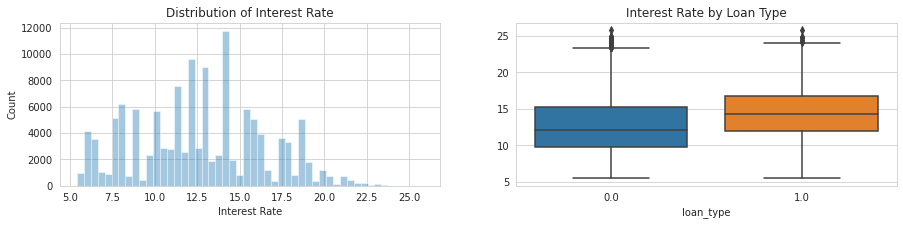

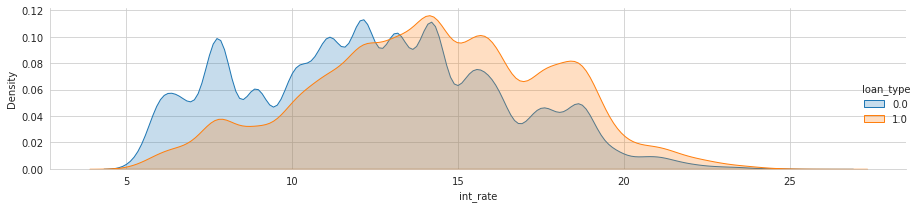

In [ ]:
plot_var('int_rate', 'Interest Rate', continuous=True)

The higher the interest rate is, the more likely for being charged off. 
There are some outliers in the Fully Paid dataset. Let's take a look at them, as outliers may distort ML analysis. 

### Outliers
- outliers can be exactly what we want to learn about, e.g., anomaly detection. 
- In this project, however, outliers may distort the picture of the data in both statistical analysis and visualization. 
- Below, I use the modified Z-score method and the IQR method. Note that the variable must be continuous, not categorical, for any of these functions to make sense.

drop_list = df.select_dtypes(exclude=['object']).columns

In [ ]:
def outliers_modified_z_score(dataframe, n, features):
    """
    Takes a dataframe df of features and returns a list of the indices corresponding to the observations containing more than n outliers according to the modified z-score Method
    """
    threshold = 3.5
    outlier_indices = []
    for col in features:
        median_y = np.median(dataframe[col])
        median_absolute_deviation_y = np.median([np.abs(y - median_y) for y in dataframe[col]])
        modified_z_scores = [0.6745 * (y - median_y) / median_absolute_deviation_y for y in dataframe[col]]
        outlier_list_col = dataframe[np.abs(modified_z_scores) > threshold].index
       # append the found outlier indices for col to the list of outlier indices 
        outlier_indices.extend(outlier_list_col)
        # select observations containing more than 2 outliers
    outlier_indices = Counter(outlier_indices)        
    multiple_outliers = list( k for k, v in outlier_indices.items() if v > n )
    return multiple_outliers

#Outliers_to_drop_z_score = outliers_modified_z_score(df,2,['loan_amnt', 'term', 'int_rate', 'installment', 'annual_inc', 'dti','fico_range_high', 'pub_rec', 'mo_sin_old_il_acct', 'mo_sin_old_rev_tl_op', 'mort_acc','earliest_cr_line_'])

In [ ]:
def outliers_iqr(dataframe, n, features):
    """
    Takes a dataframe df of features and returns a list of the indices
    corresponding to the observations containing more than n outliers according
    to the Tukey method.
    """
    outlier_indices = []
    for col in features:
        # 1st quartile (25%) & # 3rd quartile (75%)
        quartile_1, quartile_3 = np.percentile(dataframe[col], [25,75])
        iqr = quartile_3 - quartile_1
        lower_bound = quartile_1 - (iqr * 1.5)
        upper_bound = quartile_3 + (iqr * 1.5)
        # Determine a list of indices of outliers for feature col
        outlier_list_col = dataframe[(dataframe[col] < lower_bound) | (dataframe[col] > upper_bound)].index
       # append the found outlier indices for col to the list of outlier indices 
        outlier_indices.extend(outlier_list_col)
        # select observations containing more than 2 outliers
    outlier_indices = Counter(outlier_indices)        
    multiple_outliers = list( k for k, v in outlier_indices.items() if v > n )
    return multiple_outliers

In [ ]:
df_matured_loan.groupby('loan_type')['int_rate'].describe()

,count,mean,std,min,25%,50%,75%,max
loan_type,,,,,,,,
0.0,111735.0,12.427640,3.777289,5.42,9.71,12.12,15.22,25.8
1.0,16752.0,14.201153,3.577189,5.42,11.97,14.26,16.82,25.8


Any values > 75% percentile (18.5 for "charged off", 15.61 for "Fully Paid") are defined as outliers. 

In [ ]:
#df.groupby('loan_status')['int_rate'].value_counts()['Fully Paid'].sort_index()

In [ ]:
df.loc[(df.int_rate > 15.61) & (df.loan_status == 'Fully Paid')].shape[0]

54966

In [ ]:
(df.loc[(df.int_rate > 15.61) & (df.loan_status == 'Fully Paid')].shape[0])/df['loan_status'].value_counts(normalize=False, dropna=False)[0]

0.09133917933327683

In [ ]:
df.loc[(df.int_rate >18.55) & (df.loan_status == 'Charged Off')].shape[0]/df['loan_status'].value_counts(normalize=False, dropna=False)[1]

0.05858282424189907

The percentage of outliers is roughly the same for the Fully Paid/Charged off data, ~23%. A bit too much to be dropped. I will keep these outliers for now.

### installment
Data Dictionary: "The monthly payment owed by the borrower if the loan originates."

In [ ]:
df_matured_loan['installment'].describe()

count    128487.000000
mean        383.917439
std         239.217786
min          15.670000
25%         206.030000
50%         335.670000
75%         502.980000
max        1388.450000
Name: installment, dtype: float64

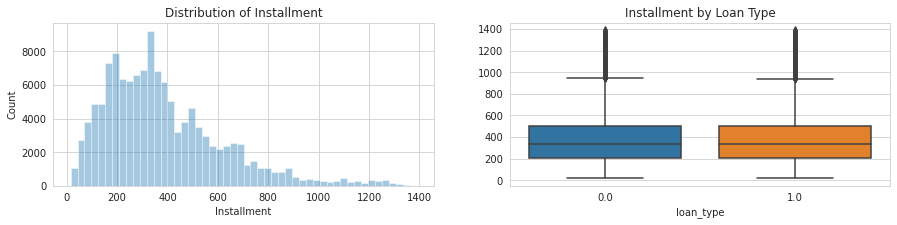

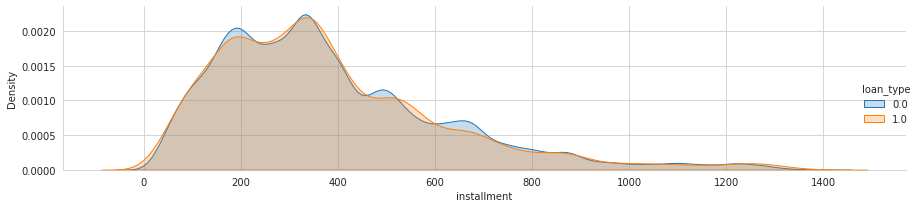

In [ ]:
plot_var('installment', 'Installment', continuous=True)

In [ ]:
df_matured_loan.groupby('loan_type')['installment'].describe()

,count,mean,std,min,25%,50%,75%,max
loan_type,,,,,,,,
0.0,111735.0,384.224290,238.836815,15.67,206.03,335.45,503.725,1388.45
1.0,16752.0,381.870758,241.740715,15.91,205.33,336.65,499.080,1388.45


Charged-off loans tend to have higher installments. Later, I will do a test to see if there are any statistical difference of "installment" between Fully Paid/charged off. 

### grade, sub_grade

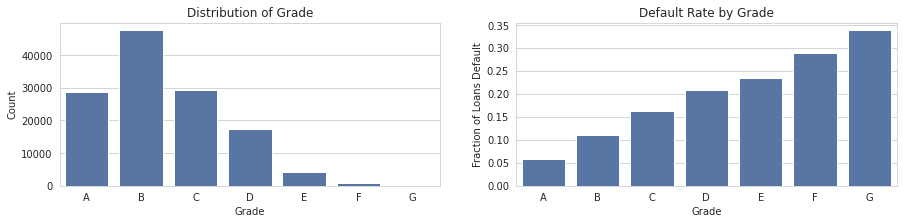

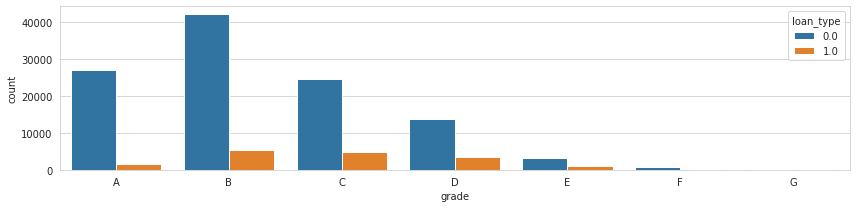

In [ ]:
plot_var('grade','Grade',continuous=False)

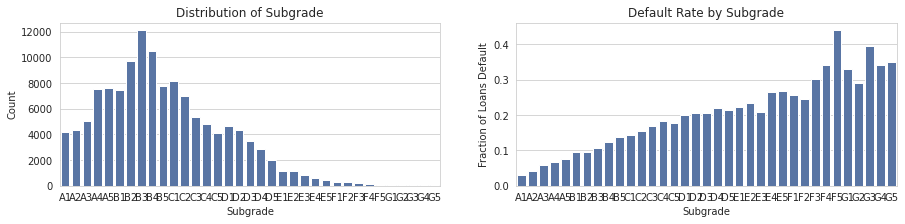

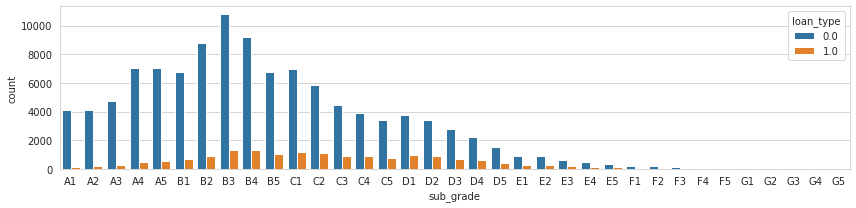

In [ ]:
plot_var('sub_grade','Subgrade',continuous=False)

There is a trend of higher fraction of loans Charged off as the grade going from A to G, with some small variations among subgrades. 

### emp_title

In [ ]:
df_matured_loan['emp_title'].describe()

count      120078
unique      85840
top       US Army
freq          360
Name: emp_title, dtype: object

There are too many unique titles for this feature to be useful, so we drop this feature. 

In [ ]:
df_matured_loan['emp_title'].sample(5)

58438                       Kevin Gray Designs
4666                            MORGAN STANLEY
15913    state of RI department of corrections
51286                          Bank of America
81491                     Clorox Manufacturing
Name: emp_title, dtype: object

In [ ]:
drop_cols('emp_title')

### emp_length


In [ ]:
df_matured_loan['emp_length'].value_counts()

10+ years    34686
2 years      12704
< 1 year     11369
3 years      10869
5 years      10461
1 year        9318
4 years       9071
6 years       8164
7 years       6910
8 years       5511
9 years       4465
Name: emp_length, dtype: int64

In [ ]:
df_matured_loan['emp_length'].replace('10+ years', '10 years', inplace=True)

In [ ]:
df_matured_loan['emp_length'].replace('< 1 year', '0 year', inplace=True)

In [ ]:
df_matured_loan['emp_length'].value_counts(dropna=False).sort_index()

0 year      11369
1 year       9318
10 years    34686
2 years     12704
3 years     10869
4 years      9071
5 years     10461
6 years      8164
7 years      6910
8 years      5511
9 years      4465
NaN          4959
Name: emp_length, dtype: int64

In [ ]:
df_matured_loan.emp_length.map( lambda x: str(x).split()[0]).value_counts(dropna=True).sort_index()

0      11369
1       9318
10     34686
2      12704
3      10869
4       9071
5      10461
6       8164
7       6910
8       5511
9       4465
nan     4959
Name: emp_length, dtype: int64

In [ ]:
df_matured_loan['emp_length'] = df_matured_loan.emp_length.map( lambda x: float(str(x).split()[0]))

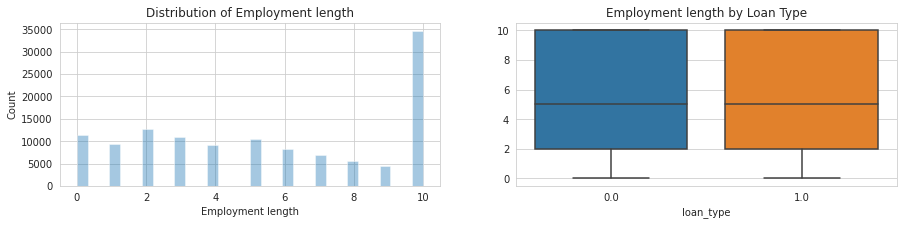

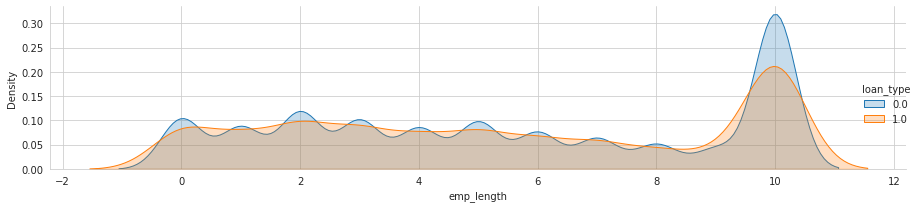

In [ ]:
plot_var('emp_length', 'Employment length', continuous=True)

Most of the loans go to the people with longer than 10 years of employments. However, the fully paid rate seems not quite related to this feature. Again, this will be further examined in a statistical test.

### home_ownership

In [ ]:
df_matured_loan['home_ownership'].value_counts()

RENT        59269
MORTGAGE    58715
OWN         10285
OTHER         175
NONE           43
Name: home_ownership, dtype: int64

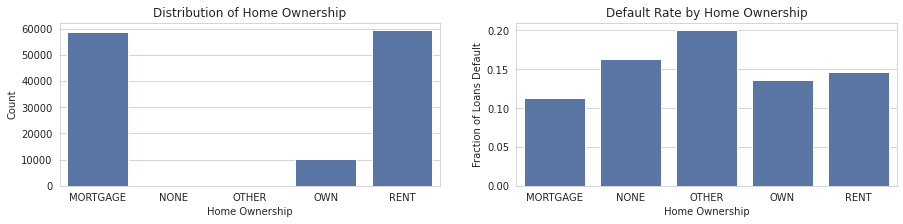

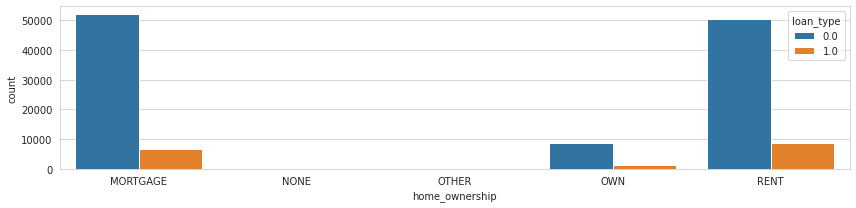

In [ ]:
plot_var('home_ownership', 'Home Ownership', continuous=False)

There appear to be small differences in charge-off rates by home ownership status. Rent & OTHER has slightly less probability of Charged-Off.

### annual_inc


In [ ]:
df_matured_loan['annual_inc'].describe()

count    1.284830e+05
mean     6.872832e+04
std      5.985515e+04
min      1.896000e+03
25%      4.100000e+04
50%      5.900000e+04
75%      8.300000e+04
max      7.141778e+06
Name: annual_inc, dtype: float64

In [ ]:
df_matured_loan['annual_inc'] = df_matured_loan['annual_inc'].apply(lambda x:np.log10(x))

In [ ]:
df_matured_loan['annual_inc'].describe()

count    128483.000000
mean          4.769499
std           0.233635
min           3.277838
25%           4.612784
50%           4.770852
75%           4.919078
max           6.853806
Name: annual_inc, dtype: float64

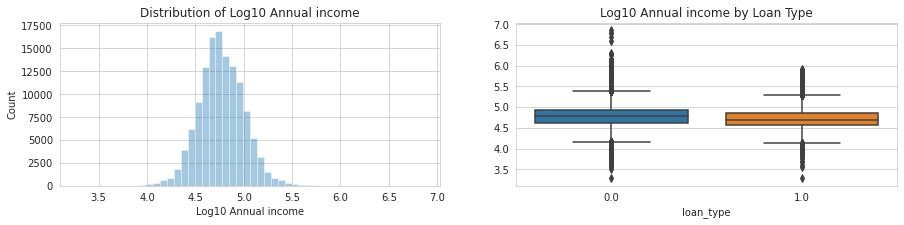

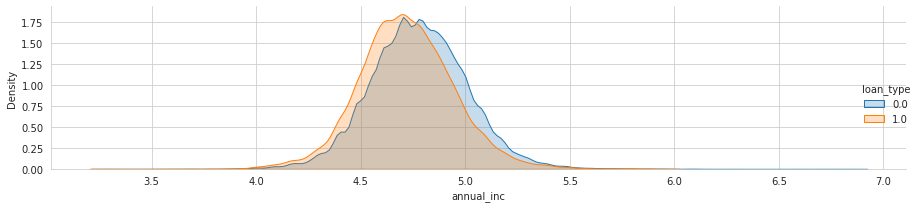

In [ ]:
plot_var('annual_inc', 'Log10 Annual income', continuous=True)

Let's look closer of the difference here

In [ ]:
df_matured_loan.groupby('loan_type')['annual_inc'].describe()

,count,mean,std,min,25%,50%,75%,max
loan_type,,,,,,,,
0.0,111731.0,4.777512,0.233134,3.277838,4.623249,4.778151,4.929419,6.853806
1.0,16752.0,4.716056,0.229919,3.301030,4.568202,4.699005,4.857332,5.924279


For both cases, there are quite a few outliers (in the lower end). 

### verication_status



In [ ]:
df_matured_loan['verification_status'].value_counts()

Not Verified       57906
Verified           44902
Source Verified    25679
Name: verification_status, dtype: int64

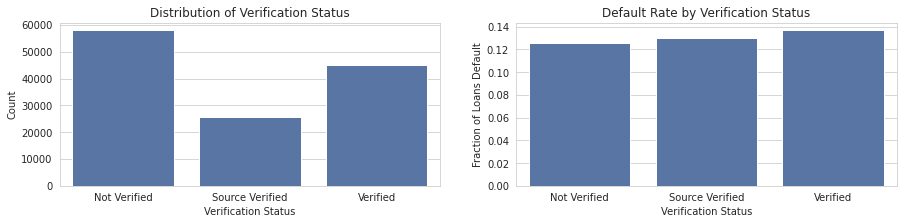

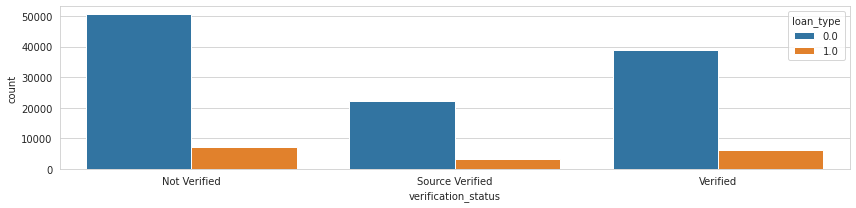

In [ ]:
plot_var('verification_status', 'Verification Status', continuous=False)

Surprisingly, verified loans have higher chance of being charged-Off.

### issue_d

In [ ]:
df_matured_loan['issue_d_year'] = df_matured_loan['issue_d'].dt.year

In [ ]:
df_matured_loan['issue_d_year'].value_counts()

2013    50102
2012    43470
2011    14101
2010    12537
2009     5281
2008     2393
2007      603
Name: issue_d_year, dtype: int64

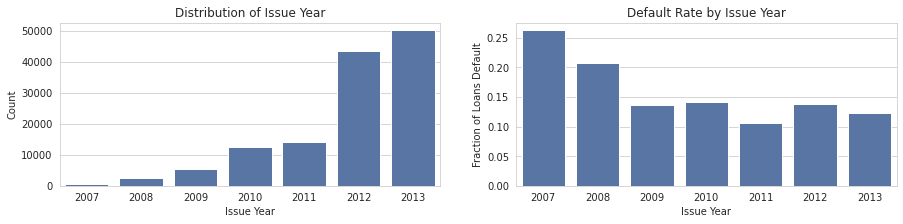

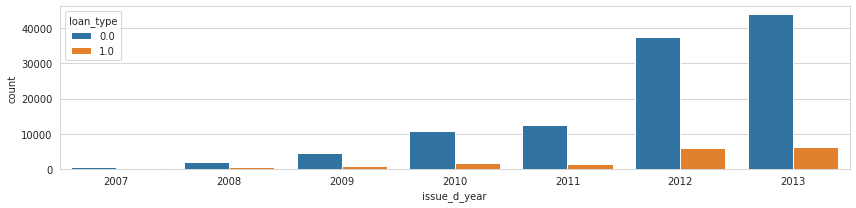

In [ ]:
plot_var('issue_d_year', 'Issue Year', continuous=False)

### purpose

In [ ]:
df_matured_loan['purpose'].value_counts()

debt_consolidation    68786
credit_card           26651
other                  8327
home_improvement       7814
major_purchase         4158
small_business         3138
car                    2442
wedding                1874
medical                1571
moving                 1227
vacation                954
house                   942
educational             422
renewable_energy        181
Name: purpose, dtype: int64

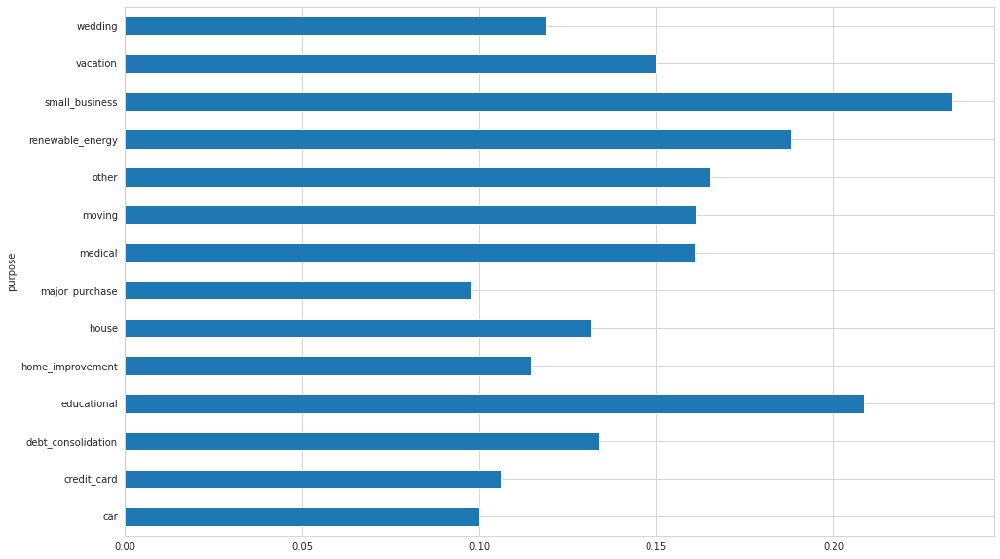

In [ ]:
plt.figure(figsize=(16, 10))
df_matured_loan.groupby('purpose')['loan_type'].mean().plot(kind='barh')

In [ ]:
df_matured_loan.groupby('purpose')['loan_type'].value_counts(normalize=True)[:,1].sort_values(ascending=False)

purpose
small_business        0.233588
educational           0.208531
renewable_energy      0.187845
other                 0.165125
moving                0.161369
medical               0.161044
vacation              0.149895
debt_consolidation    0.133719
house                 0.131635
wedding               0.118997
home_improvement      0.114538
credit_card           0.106450
car                   0.099918
major_purchase        0.097884
Name: loan_type, dtype: float64

We see that, 30% of the loans for small_business are charged off, but only 12% of wedding are charged Off.

### title

In [ ]:
df_matured_loan['title'].describe()

count                 128470
unique                 42557
top       Debt consolidation
freq                    9994
Name: title, dtype: object

In [ ]:
df_matured_loan['title'].value_counts().head(10)

Debt consolidation           9994
Debt Consolidation           7957
Credit card refinancing      3556
Consolidation                2456
debt consolidation           2359
Debt Consolidation Loan      2263
Credit Card Consolidation    1313
Personal Loan                1266
Other                        1149
consolidation                1035
Name: title, dtype: int64

There are 12 unique purposes in the dataset, and from the top 10 titles, it seems that this information is covered in the "purpose". So we drop this column. 

In [ ]:
drop_cols('title')

### zip_code, addr_stat

In [ ]:
df_matured_loan['zip_code'].describe()

count     128487
unique       855
top        945xx
freq        1701
Name: zip_code, dtype: object

In [ ]:
df_matured_loan['addr_state'].describe()

count     128487
unique        50
top           CA
freq       22787
Name: addr_state, dtype: object

There are many unique "zip_code" values, and the zip_code info should be equivalent to "addr_stat". Therefore we drop the "zip_code". 

In [ ]:
drop_cols('zip_code')

In [ ]:
df_matured_loan.groupby('addr_state')['loan_type'].value_counts(normalize=True)[:,1].sort_values(ascending=False)

addr_state
NE    0.545455
MS    0.222222
NV    0.183106
IA    0.166667
FL    0.157578
NJ    0.147214
IN    0.145995
AR    0.144397
TN    0.144158
RI    0.143101
AL    0.140162
NM    0.140089
HI    0.137883
MO    0.137664
MI    0.135384
CA    0.135033
OK    0.134272
NY    0.133749
AZ    0.131898
WI    0.131868
NC    0.131086
GA    0.129796
VA    0.127226
WA    0.127032
MD    0.126330
MA    0.124712
OR    0.124707
UT    0.122002
SD    0.121771
LA    0.121678
OH    0.121410
PA    0.121276
AK    0.120643
DE    0.119632
CT    0.118300
SC    0.117479
MT    0.116992
IL    0.116728
CO    0.115370
KY    0.114910
MN    0.114617
VT    0.111650
TX    0.110271
KS    0.106557
NH    0.091065
ID    0.090909
WV    0.077990
WY    0.075000
DC    0.064777
Name: loan_type, dtype: float64

MS has the highest fraction of Charged Off (0.28), whereas DC has the lowest fraction at 0.13. 

### dti

In [ ]:
df_matured_loan['dti'].describe()

count    128487.000000
mean         15.709192
std           7.581213
min           0.000000
25%          10.010000
50%          15.440000
75%          21.120000
max          34.990000
Name: dti, dtype: float64

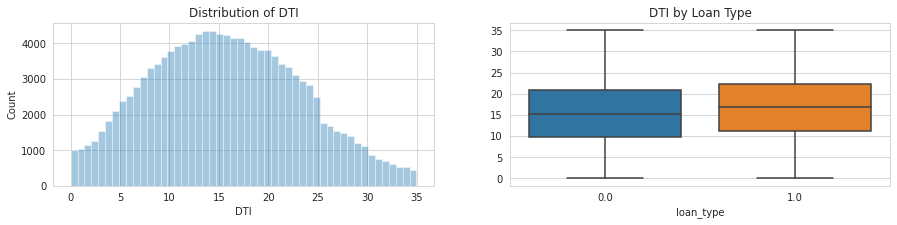

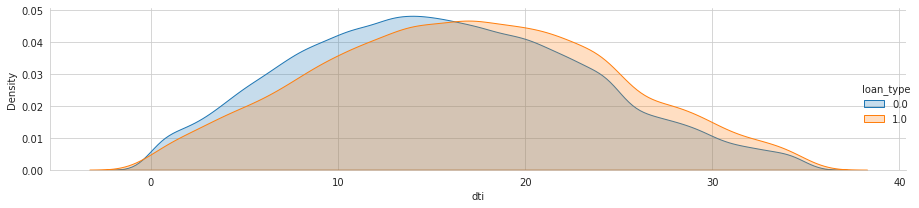

In [ ]:
plot_var('dti', 'DTI', continuous=True)

Borrowers who have higher DTI are more likely to be charged off 

### earliest_cr_line

In [ ]:
df_matured_loan['earliest_cr_line_year'] = df_matured_loan['earliest_cr_line'].dt.year

In [ ]:
df_matured_loan['earliest_cr_line_year'].value_counts()

2000.0    10395
2001.0     9448
1999.0     9436
1998.0     8263
2002.0     7503
1997.0     6822
1996.0     6576
2003.0     6282
1995.0     6066
2004.0     5911
1994.0     5597
2005.0     5427
2006.0     5131
1993.0     4072
2007.0     3589
1992.0     3121
1990.0     2998
1991.0     2884
1989.0     2570
1988.0     2163
1987.0     1815
2008.0     1772
1986.0     1504
1985.0     1355
1984.0     1187
1983.0     1023
1982.0      721
2009.0      572
1980.0      559
1981.0      557
1978.0      542
1979.0      499
1977.0      357
1976.0      288
1975.0      244
1974.0      199
1973.0      176
1972.0      162
1971.0      119
1970.0      114
1969.0       99
2010.0       88
1967.0       59
1968.0       47
1966.0       33
1963.0       27
1965.0       25
1962.0       15
1964.0       14
1960.0       11
1961.0        5
1959.0        4
1955.0        3
1958.0        2
1954.0        2
1957.0        1
1950.0        1
1946.0        1
1956.0        1
1951.0        1
Name: earliest_cr_line_year, dtype: int6

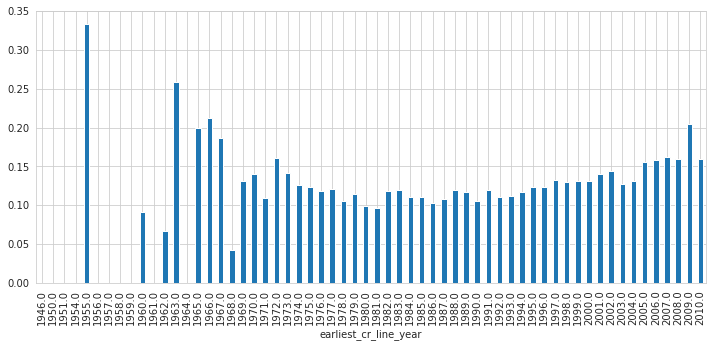

In [ ]:
plt.figure(figsize=(12, 5))
df_matured_loan.groupby('earliest_cr_line_year')['loan_type'].mean().plot(kind='bar')

In [ ]:
drop_cols('earliest_cr_line')

### open_acc
Data Dictionary: "The number of open credit lines in the borrower's credit file."

In [ ]:
df_matured_loan['open_acc'].describe()

count    128458.000000
mean         10.314578
std           4.559966
min           0.000000
25%           7.000000
50%          10.000000
75%          13.000000
max          52.000000
Name: open_acc, dtype: float64

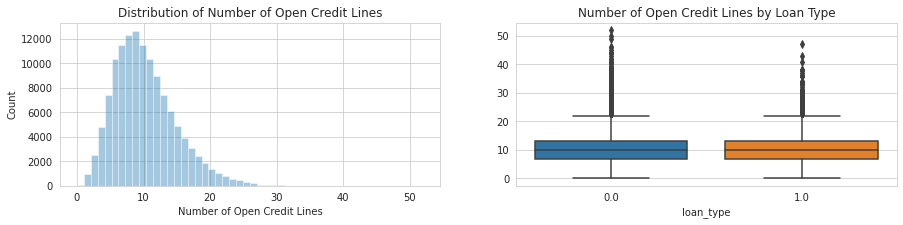

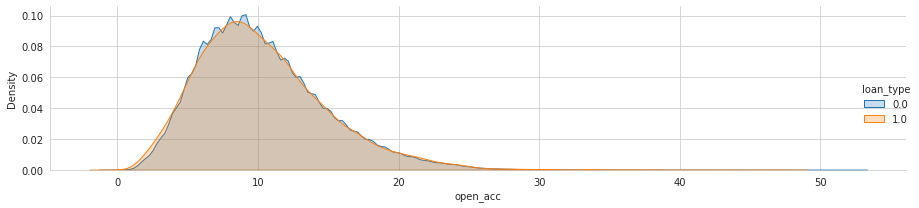

In [ ]:
plot_var('open_acc', 'Number of Open Credit Lines', continuous=True)

There seems no significant difference in number of credit lines between fully paid loans and charged-off loans.

In [ ]:
df_matured_loan.groupby('loan_type')['open_acc'].describe()

,count,mean,std,min,25%,50%,75%,max
loan_type,,,,,,,,
0.0,111709.0,10.318345,4.544147,0.0,7.0,10.0,13.0,52.0
1.0,16749.0,10.289450,4.664162,0.0,7.0,10.0,13.0,47.0


### pub_rec
Data Dictionary: "Number of derogatory public records."

In [ ]:
df_matured_loan['pub_rec'].describe()

count    128458.000000
mean          0.078119
std           0.342594
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          54.000000
Name: pub_rec, dtype: float64

In [ ]:
df_matured_loan['pub_rec'].value_counts().sort_values(ascending=False)

0.0     119427
1.0       8377
2.0        482
3.0        102
4.0         38
5.0         17
6.0          6
7.0          5
8.0          2
10.0         1
54.0         1
Name: pub_rec, dtype: int64

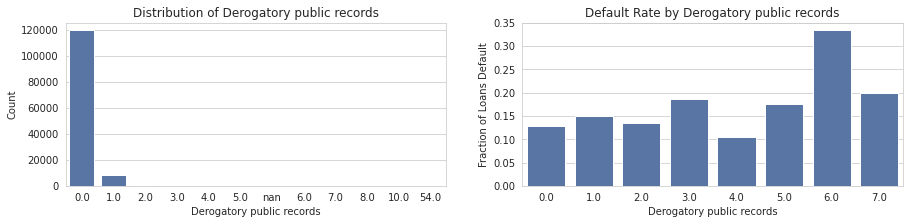

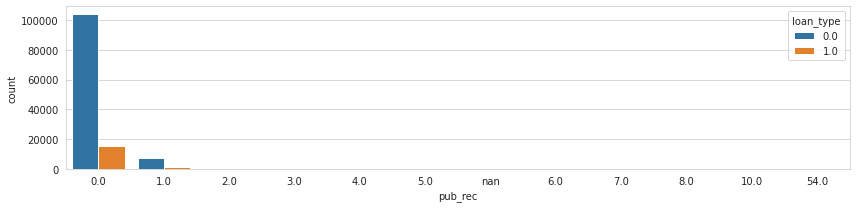

In [ ]:
plot_var('pub_rec','Derogatory public records', continuous=False)

"pub_rec" =3 have significant of Charged-Off rate.

### total_acc
Data Dictionary: "The total number of credit lines currently in the borrower's credit file."

In [ ]:
df_matured_loan['total_acc'].describe()

count    128458.000000
mean         23.016651
std          11.139188
min           1.000000
25%          15.000000
50%          21.000000
75%          30.000000
max          91.000000
Name: total_acc, dtype: float64

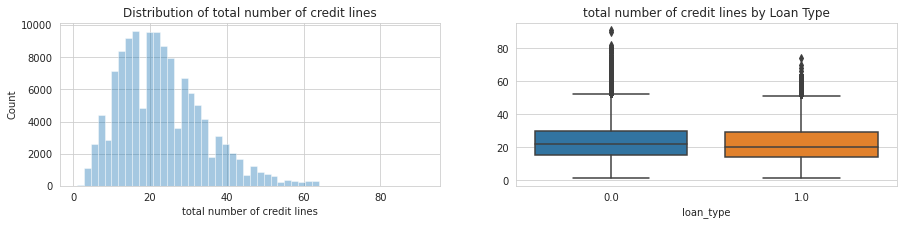

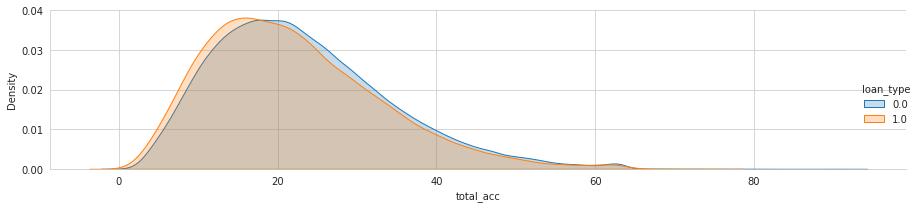

In [ ]:
plot_var('total_acc', 'total number of credit lines', continuous=True)

### initial_list_status
Data Dictionary: "The initial listing status of the loan. Possible values are – W, F  (whole vs. fractional)

In [ ]:
df_matured_loan['initial_list_status'].value_counts()

f    111504
w     16983
Name: initial_list_status, dtype: int64

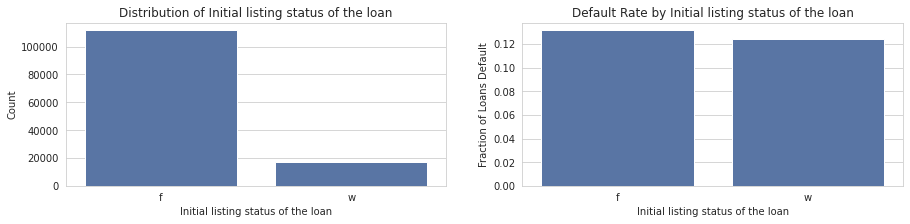

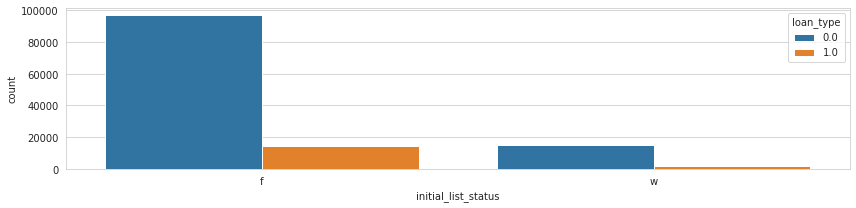

In [ ]:
plot_var('initial_list_status','Initial listing status of the loan', continuous=False)

Most of the loans are in whole amount and half are in fractional amount. "Whole" has higher fraction of Charged-Off.

### policy_code
Data Dictionary: "publicly available policy_code=1; new products not publicly available policy_code=2"

In [ ]:
df_matured_loan['policy_code'].value_counts()

1.0    128487
Name: policy_code, dtype: int64

All values are the same; drop this feature. 

In [ ]:
drop_cols('policy_code')

### application_type
Data Dictionary: "Indicates whether the loan is an individual application or a joint application with two co-borrowers."

In [ ]:
df_matured_loan['application_type'].value_counts()

INDIVIDUAL    128487
Name: application_type, dtype: int64

All values are the same; drop this feature. 

In [ ]:
drop_cols('application_type')

In [ ]:
df_matured_loan.columns

Index(['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'purpose', 'addr_state', 'dti', 'delinq_2yrs', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'initial_list_status', 'loan_age', 'loan_type', 'issue_d_year',
       'earliest_cr_line_year'],
      dtype='object')

## 5. Hypothesis Testing  
<a id="corr"></a>

If p-value < 0.05 (95% confidence level), we can reject the null hypothesis  

- Numerical features ('loan_amnt', 'int_rate', 'installment', 'emp_length', 'annual_inc', 'dti','delinq_2yrs', 'open_acc', 'pub_rec', 'revol_bal' 'revol_util', 'total_acc'): Z tests

- Categorical features ('grade', 'verification_status', 'purpose'): Chi-squared Tests

In [ ]:
df_matured_loan.columns

Index(['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'purpose', 'addr_state', 'dti', 'delinq_2yrs', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'initial_list_status', 'loan_age', 'loan_type', 'issue_d_year',
       'earliest_cr_line_year'],
      dtype='object')

In [ ]:
df_ht = df_matured_loan.dropna()

In [ ]:
z_test = ['loan_amnt', 'int_rate', 'installment', 'emp_length', 'annual_inc',
       'dti', 'delinq_2yrs', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc']

In [ ]:
chi_square = ['grade', 'verification_status', 'purpose']

In [ ]:
from statsmodels.stats.weightstats import ztest
def two_sample_z_test(feature):
  dist1 = df_ht.loc[df_ht.loan_type  == 0,feature]
  dist2 = df_ht.loc[df_ht.loan_type  == 1,feature]
  print(feature+': ')
  z_score, p_value = ztest(dist1, dist2)
  print('z-score = {}; p-value = {}'.format(z_score, p_value),'\n')

In [ ]:
from scipy.stats import chi2_contingency
def chi2_test(feature):
  dist1 = df_ht.loc[df_ht.loan_type == 0,feature].value_counts().sort_index().tolist()
  dist2 = df_ht.loc[df_ht.loan_type == 1,feature].value_counts().sort_index().tolist()
  chi2, p, dof, expctd = chi2_contingency([dist1,dist2])
  print(feature+':')
  print("chi-square test statistic:", chi2)
  print("p-value", p, '\n')

In [ ]:
for i in z_test:
  two_sample_z_test(i)

loan_amnt: 
z-score = 3.8395108889495444; p-value = 0.00012327966206552812 

int_rate: 
z-score = -56.34972454362213; p-value = 0.0 

installment: 
z-score = 0.21887608344410098; p-value = 0.826746577407011 

emp_length: 
z-score = 3.2555608955070503; p-value = 0.001131686250619076 

annual_inc: 
z-score = 29.832892145268712; p-value = 1.4635176725731033e-195 

dti: 
z-score = -19.958166806618504; p-value = 1.2729694751447942e-88 

delinq_2yrs: 
z-score = -3.165133720694898; p-value = 0.0015501169305615682 

open_acc: 
z-score = -0.411616725470091; p-value = 0.6806203705276432 

pub_rec: 
z-score = -4.2797834535621675; p-value = 1.87075242581036e-05 

revol_bal: 
z-score = 4.293977705302252; p-value = 1.7550010578072197e-05 

revol_util: 
z-score = -23.022045600342537; p-value = 2.8039875568353878e-117 

total_acc: 
z-score = 11.056549350809796; p-value = 2.037874364930199e-28 



In [ ]:
for i in chi_square:
  chi2_test(i)

grade:
chi-square test statistic: 3270.6706827471403
p-value 0.0 

verification_status:
chi-square test statistic: 16.344300597428756
p-value 0.00028241009700584186 

purpose:
chi-square test statistic: 648.5363230895214
p-value 3.390681863191269e-130 



OK, it seems that all of these features have different distributions for Fully Paid/Charged Off.

## 6. Data Preprocessing
<a id="featureeng"></a>

- One-Hot Encoding
- Train/Test Split
- Imputing missing values 
- Scaling 


In [ ]:
missing_values_table(df_matured_loan)

Your selected dataframe has 25 columns.
There are 8 columns that have missing values.


,Missing Values,% of Total Values,type
emp_length,4959,3.9,float64
revol_util,153,0.1,float64
delinq_2yrs,29,0.0,float64
open_acc,29,0.0,float64
pub_rec,29,0.0,float64
total_acc,29,0.0,float64
earliest_cr_line_year,29,0.0,float64
annual_inc,4,0.0,float64


There are 8 variables with missing values (with very small percentage). They are not categorical variables. 

### 6.1 Categorical Variables
<a id="dummies"></a>

In [ ]:
dummy_list =['grade','sub_grade','home_ownership','verification_status','purpose','addr_state','initial_list_status']

In [ ]:
df_matured_loan[dummy_list].isnull().any()

grade                  False
sub_grade              False
home_ownership         False
verification_status    False
purpose                False
addr_state             False
initial_list_status    False
dtype: bool

In [ ]:
df_matured_loan = pd.get_dummies(df_matured_loan, columns=dummy_list, drop_first=True)

In [ ]:
df_matured_loan.shape

(128487, 127)

In [ ]:
df_matured_loan.head(1)

,loan_amnt,term,int_rate,installment,emp_length,annual_inc,issue_d,dti,delinq_2yrs,open_acc,pub_rec,revol_bal,revol_util,total_acc,loan_age,loan_type,issue_d_year,earliest_cr_line_year,grade_B,grade_C,grade_D,grade_E,grade_F,grade_G,sub_grade_A2,sub_grade_A3,sub_grade_A4,sub_grade_A5,sub_grade_B1,sub_grade_B2,sub_grade_B3,sub_grade_B4,sub_grade_B5,sub_grade_C1,sub_grade_C2,sub_grade_C3,sub_grade_C4,sub_grade_C5,sub_grade_D1,sub_grade_D2,sub_grade_D3,sub_grade_D4,sub_grade_D5,sub_grade_E1,sub_grade_E2,sub_grade_E3,sub_grade_E4,sub_grade_E5,sub_grade_F1,sub_grade_F2,sub_grade_F3,sub_grade_F4,sub_grade_F5,sub_grade_G1,sub_grade_G2,sub_grade_G3,sub_grade_G4,sub_grade_G5,home_ownership_NONE,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT,verification_status_Source Verified,verification_status_Verified,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,addr_state_AL,addr_state_AR,addr_state_AZ,addr_state_CA,addr_state_CO,addr_state_CT,addr_state_DC,addr_state_DE,addr_state_FL,addr_state_GA,addr_state_HI,addr_state_IA,addr_state_ID,addr_state_IL,addr_state_IN,addr_state_KS,addr_state_KY,addr_state_LA,addr_state_MA,addr_state_MD,addr_state_ME,addr_state_MI,addr_state_MN,addr_state_MO,addr_state_MS,addr_state_MT,addr_state_NC,addr_state_NE,addr_state_NH,addr_state_NJ,addr_state_NM,addr_state_NV,addr_state_NY,addr_state_OH,addr_state_OK,addr_state_OR,addr_state_PA,addr_state_RI,addr_state_SC,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY,initial_list_status_w
0,5000.0,36,10.65,162.87,10.0,4.380211,2011-12-01,27.65,0.0,3.0,0.0,13648.0,83.7,9.0,49.0,0.0,2011,1985.0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Looks good. all data are numerical, except "issue_d", which we will use to split test/train sample and then it will be dropped. 

### 6.2 Train/Test data split
<a id="split"></a>

I will use loans funded on earlier dates to predict the outcome of loans funded on later dates.

In [ ]:
df_matured_loan['issue_d'].isnull().any()

False

"issue_d" has month and year, no null values.

In [ ]:
df_matured_loan['issue_d'].describe()

count                  128487
unique                     74
top       2013-07-01 00:00:00
freq                     8978
first     2007-06-01 00:00:00
last      2013-07-01 00:00:00
Name: issue_d, dtype: object

There are 68 unique values. The first loans were issued in Jan 2007 and the last loans were issued in Jan 2013. The busiest month was Oct 2012, with 1901 loans funded in that month.

Text(0.5, 1.0, 'Loans funded per Year')

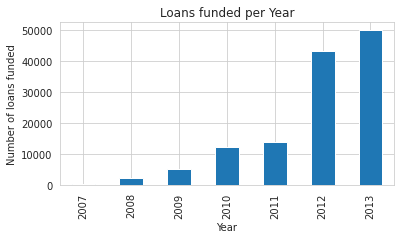

In [ ]:
plt.figure(figsize=(6,3))
df_matured_loan['issue_d'].dt.year.value_counts().sort_index().plot.bar()
plt.xlabel('Year')
plt.ylabel('Number of loans funded')
plt.title('Loans funded per Year')

We will split the train/test sample at 8:2. 

In [ ]:
df_train = df_matured_loan.loc[df['issue_d']  < df_matured_loan['issue_d'].quantile(0.8)]
df_test =  df_matured_loan.loc[df['issue_d'] >= df_matured_loan['issue_d'].quantile(0.8)]

In [ ]:
print('Number of loans in the partition:   ', df_train.shape[0] + df_test.shape[0])
print('Number of loans in the full dataset:', df_matured_loan.shape[0])

Number of loans in the partition:    128487
Number of loans in the full dataset: 128487


Let's look at the summary statistics of the issue dates in the train/test sets.

In [ ]:
df_train['issue_d'].describe()

count                   42535
unique                     57
top       2012-12-01 00:00:00
freq                     4797
first     2007-06-01 00:00:00
last      2012-12-01 00:00:00
Name: issue_d, dtype: object

In [ ]:
df_test['issue_d'].describe()

count                   85952
unique                     19
top       2013-07-01 00:00:00
freq                     8978
first     2012-01-01 00:00:00
last      2013-07-01 00:00:00
Name: issue_d, dtype: object

Now we can delete the "issue_d"

In [ ]:
df_train.drop('issue_d', axis=1, inplace=True)
df_test.drop('issue_d', axis=1, inplace=True)

Now separate the predictor variables from the target variable

In [ ]:
X_train = df_train.drop(['loan_type'], axis=1)
y_train = df_train.loc[:, 'loan_type']

X_test = df_test.drop(['loan_type'], axis=1)
y_test = df_test['loan_type']

### 6.3 Imputing missing values
<a id="imputing"></a>   
I will create an imputer object with the strategy set to median. I then train this object on the **training** data and use it to fill in the missing values in both the **training and testing** data. This means that missing values in the test data are filled in with the corresponding median value from the training data. We do it this way to avoid the problem of test data leakage.

In [ ]:
X_train.head(5)

,loan_amnt,term,int_rate,installment,emp_length,annual_inc,dti,delinq_2yrs,open_acc,pub_rec,revol_bal,revol_util,total_acc,loan_age,issue_d_year,earliest_cr_line_year,grade_B,grade_C,grade_D,grade_E,grade_F,grade_G,sub_grade_A2,sub_grade_A3,sub_grade_A4,sub_grade_A5,sub_grade_B1,sub_grade_B2,sub_grade_B3,sub_grade_B4,sub_grade_B5,sub_grade_C1,sub_grade_C2,sub_grade_C3,sub_grade_C4,sub_grade_C5,sub_grade_D1,sub_grade_D2,sub_grade_D3,sub_grade_D4,sub_grade_D5,sub_grade_E1,sub_grade_E2,sub_grade_E3,sub_grade_E4,sub_grade_E5,sub_grade_F1,sub_grade_F2,sub_grade_F3,sub_grade_F4,sub_grade_F5,sub_grade_G1,sub_grade_G2,sub_grade_G3,sub_grade_G4,sub_grade_G5,home_ownership_NONE,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT,verification_status_Source Verified,verification_status_Verified,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,addr_state_AL,addr_state_AR,addr_state_AZ,addr_state_CA,addr_state_CO,addr_state_CT,addr_state_DC,addr_state_DE,addr_state_FL,addr_state_GA,addr_state_HI,addr_state_IA,addr_state_ID,addr_state_IL,addr_state_IN,addr_state_KS,addr_state_KY,addr_state_LA,addr_state_MA,addr_state_MD,addr_state_ME,addr_state_MI,addr_state_MN,addr_state_MO,addr_state_MS,addr_state_MT,addr_state_NC,addr_state_NE,addr_state_NH,addr_state_NJ,addr_state_NM,addr_state_NV,addr_state_NY,addr_state_OH,addr_state_OK,addr_state_OR,addr_state_PA,addr_state_RI,addr_state_SC,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY,initial_list_status_w
0,5000.0,36,10.65,162.87,10.0,4.380211,27.65,0.0,3.0,0.0,13648.0,83.7,9.0,49.0,2011,1985.0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2400.0,36,15.96,84.33,10.0,4.088207,8.72,0.0,2.0,0.0,2956.0,98.5,10.0,49.0,2011,2001.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,10000.0,36,13.49,339.31,10.0,4.691965,20.00,0.0,10.0,0.0,5598.0,21.0,37.0,49.0,2011,1996.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,5000.0,36,7.90,156.46,3.0,4.556303,11.20,0.0,9.0,0.0,7963.0,28.3,12.0,49.0,2011,2004.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,3000.0,36,18.64,109.43,9.0,4.681241,5.35,0.0,4.0,0.0,8221.0,87.5,4.0,49.0,2011,2007.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create an imputer object with a median filling strategy
imputer = SimpleImputer(strategy='median')

# Train on the training features
imputer.fit(X_train)

# Transform both training and testing data
X_train = pd.DataFrame(imputer.transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(imputer.transform(X_test), columns=X_test.columns)

In [ ]:
df_matured_loan.columns

Index(['loan_amnt', 'term', 'int_rate', 'installment', 'emp_length',
       'annual_inc', 'issue_d', 'dti', 'delinq_2yrs', 'open_acc',
       ...
       'addr_state_TN', 'addr_state_TX', 'addr_state_UT', 'addr_state_VA',
       'addr_state_VT', 'addr_state_WA', 'addr_state_WI', 'addr_state_WV',
       'addr_state_WY', 'initial_list_status_w'],
      dtype='object', length=127)

In [ ]:
missing_values_table(X_train)

Your selected dataframe has 125 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values,type


In [ ]:
missing_values_table(X_test)

Your selected dataframe has 125 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values,type


### 6.4 Feature Scaling
<a id="scaling"></a>  

As features are measured in different units, they cover different ranges. Some ML models, such as SVM, KNN that take into account distance measures between observations are therefore significantly affected by the range of the features and scaling allows them to learn. While some methods, such as Linear Regression and Ransom Forest do not actually require feature scaling, it's still best practice to take this step when we are comparing multiple algorithms. 


In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
# Create an imputer object with a median filling strategy
scaler = StandardScaler()

# Train on the training features
scaler.fit(X_train)

# Transform both training and testing data
X_train = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

### 6.5 SMOTE

* In order to re-balance data, we use the Synthetic Minority Over-sampling Technique (SMOTE) to up-sample the number of unpaid loan
* I over-sampled only on the training data, because by oversampling only on the training data, none of the information in the test data is being used to create synthetic observations, therefore, no information will bleed from test data into the model training.


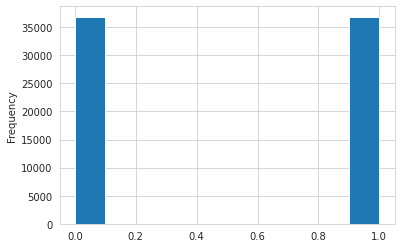

In [ ]:
# Define the resampling 
sm = SMOTE(random_state=42)
# Create the resampled feature set
X_train, y_train = sm.fit_resample(X_train, y_train)
# Plot the resampled data
y_train.plot.hist();

* Now I have a perfect balanced data

## 7. Modeling 
<a id="modeling"></a>



In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier

# 1. Decision Tree

tree_model = DecisionTreeClassifier()
tree_model.fit(X_train, y_train)
tree_yhat = tree_model.predict(X_test)

# 2. Logistic Regression

lr = LogisticRegression()
lr.fit(X_train, y_train)
lr_yhat = lr.predict(X_test)

# 3. Random Forest Tree

rf = RandomForestClassifier()
rf.fit(X_train, y_train)
rf_yhat = rf.predict(X_test)

# 4. XGBoost 

xgb = XGBClassifier()
xgb.fit(X_train, y_train)
xgb_yhat = xgb.predict(X_test)

# 5. SVM 
svc = SVC(random_state=42)
svc.fit(X_train, y_train)
svc_yhat = svc.predict(X_test)

In [ ]:
def plot_roc_auc(model):
  roc_auc = roc_auc_score(y_test, model.predict(X_test))
  fpr, tpr, thresholds = roc_curve(y_test, model.predict_proba(X_test)[:,1])
  plt.figure()
  plt.plot(fpr, tpr, label='(area = %0.2f)' % roc_auc)
  plt.plot([0, 1], [0, 1],'r--')
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('ROC-'+ str(model))
  plt.legend(loc="lower right")
  plt.show()

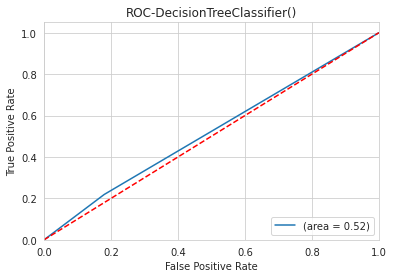

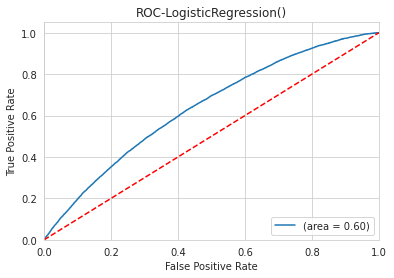

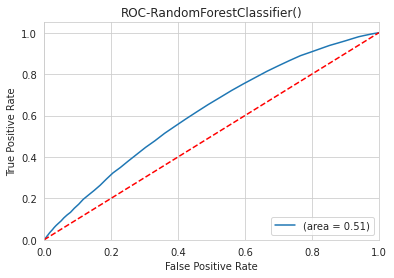

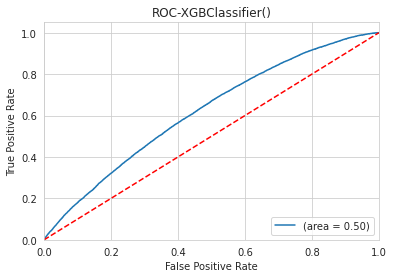

In [ ]:
models=[tree_model, lr, rf, xgb]
for m in models:
  plot_roc_auc(m)